# Spotify streaming history

## Set up

In [1]:
import pandas as pd
import numpy as np
import json
import os

import requests

import spotipy
from spotipy.oauth2 import SpotifyOAuth
import sys
import spotipy_func as spf
from plot_func import *

import seaborn as sns
import matplotlib.pyplot as plt

### Load data

#### Streaming history

In [9]:
current_dir = os.getcwd()
parent_dir = os.path.dirname(os.path.dirname(current_dir))
history_dir = os.path.join(parent_dir, 'Spotify Extended Streaming History/')
data = None
for file in os.listdir(history_dir):
    if file.endswith('.json'):
        history_file = os.path.join(history_dir, file)
        if data is None:
            with open(history_file, 'r') as file:
                data = json.load(file)
        else:
            with open(history_file, 'r') as file:
                data.extend(json.load(file))
df = pd.DataFrame(data)

### Clean data

In [10]:
df['ts'] = pd.to_datetime(df['ts'])
df['seconds_played'] = pd.to_numeric(df['ms_played']) / 1000
df['date'] = df['ts'].dt.date
df['time'] = df['ts'].dt.time
df['year'] = df['ts'].dt.year
df['month'] = df['ts'].dt.month
df['day'] = df['ts'].dt.day
df['weekday'] = df['ts'].dt.weekday
df['SpotifyID'] = df['spotify_track_uri'].str.split(':').str[2]
# change colname
df.rename(columns={'master_metadata_track_name': 'track_name', 
                   'master_metadata_album_artist_name': 'artist_name',
                   'master_metadata_album_album_name': 'album_name'}, inplace=True)
#drop if spotifyID is null
df = df.dropna(subset=['SpotifyID'])
trackids = df['SpotifyID'].unique().tolist()

### Liked songs

In [4]:
# Get all liked songs features. To get the songs of a specific playlist, use the playlist id (e.g. from get_my_playlists())
sp              = spf.load_spotify_client(config_path     = 'config.json')
tracks          = spf.get_tracks         (sp, playlist_id = None)
track_ids       = spf.extract_track_ids  (sp, tracks)

### Get audio features from reccobeats

In [5]:
# Get audio features from ReccoBeats API
for i in range(0, len(trackids), 40):
    track_ids_batch = trackids[i:i+40]
    result = spf.get_reccobeats_audio_features(track_ids_batch)
    if i == 0:
        df_features = pd.json_normalize(result['content'])
    else:
        df_features = pd.concat([df_features, pd.json_normalize(result['content'])], ignore_index=True)
df_features['spotify_id'] = df_features['href'].str.split('/').str[-1]

### Merge data

In [ ]:
df = df.merge(df_features, left_on='SpotifyID', right_on='spotify_id', how='left')
df['liked'] = df['SpotifyID'].isin(track_ids)


,ts,platform,ms_played,conn_country,ip_addr,track_name,artist_name,album_name,spotify_track_uri,episode_name,...,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,spotify_id,liked
0,2025-08-27 09:17:10+00:00,android,188516,DE,2a00:fbc:f318:33ce:e700:5f0d:cfc4:85f,Family,Surfer Girl,Family,spotify:track:12zKhNQ03yu5LFfbl3Qsma,None,...,0.000044,10.0,0.1220,-7.021,0.0,0.0421,87.014,0.608,12zKhNQ03yu5LFfbl3Qsma,False
1,2025-08-27 09:20:27+00:00,android,199120,DE,2a00:fbc:f318:33ce:e700:5f0d:cfc4:85f,Lass es kreisen,AnnenMayKantereit,Es ist Abend und wir sitzen bei mir,spotify:track:6Pn5YAIhhT85vxBD3YoIzG,None,...,0.661000,10.0,0.1330,-6.662,0.0,0.0490,100.041,0.863,6Pn5YAIhhT85vxBD3YoIzG,True
2,2025-08-27 09:24:46+00:00,android,261000,DE,2a00:fbc:f318:33ce:e700:5f0d:cfc4:85f,Time to Pretend,MGMT,Oracular Spectacular,spotify:track:4iG2gAwKXsOcijVaVXzRPW,None,...,0.077700,2.0,0.3000,-3.249,1.0,0.0452,100.990,0.421,4iG2gAwKXsOcijVaVXzRPW,True
3,2025-08-27 09:28:06+00:00,android,202012,DE,2a00:fbc:f318:33ce:e700:5f0d:cfc4:85f,soso (with Ozuna),Omah Lay,Boy Alone,spotify:track:4kYR66ZNCcfQ6pyASeW8tw,None,...,0.004740,3.0,0.1100,-7.557,0.0,0.1190,104.971,0.609,4kYR66ZNCcfQ6pyASeW8tw,True
4,2025-08-27 09:32:15+00:00,android,250397,DE,2a00:fbc:f318:33ce:e700:5f0d:cfc4:85f,Paradise,Stick Figure,Wisdom,spotify:track:3iyMN5JhGnJXvKvFr8Mf7S,None,...,0.107000,9.0,0.3430,-7.858,0.0,0.0568,82.502,0.441,3iyMN5JhGnJXvKvFr8Mf7S,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50279,2024-12-11 15:31:17+00:00,linux,217650,DE,134.2.251.10,Lost in Echoes,Caskets,Lost Souls,spotify:track:13YWByXibBltt3T5u3IcT7,None,...,0.000116,7.0,0.0814,-6.693,0.0,0.0723,75.034,0.444,13YWByXibBltt3T5u3IcT7,False
50280,2024-12-11 15:35:01+00:00,linux,223143,DE,134.2.251.10,KILLING ME,TSS,KILLING ME,spotify:track:0pUhjwRcebbqwe8RmICp6d,None,...,0.008760,6.0,0.3410,-4.472,0.0,0.1510,93.972,0.313,0pUhjwRcebbqwe8RmICp6d,False
50281,2024-12-11 15:37:54+00:00,linux,171589,DE,134.2.251.10,Chaotic,Memphis May Fire,Chaotic,spotify:track:4mdp26YsqfiqL6Fj9DJmaV,None,...,0.004250,4.0,0.6570,-3.772,0.0,0.1660,117.043,0.564,4mdp26YsqfiqL6Fj9DJmaV,False
50282,2024-12-11 15:41:25+00:00,linux,209948,DE,134.2.251.10,Shallow,Magnolia Park,Shallow,spotify:track:55h5xNwW8na2bHKlZUfHh7,None,...,0.000000,4.0,0.0887,-2.813,0.0,0.0849,135.061,0.564,55h5xNwW8na2bHKlZUfHh7,False


In [15]:
# save to csv
df.to_csv('data/streaming_history_with_features.csv', index=False)

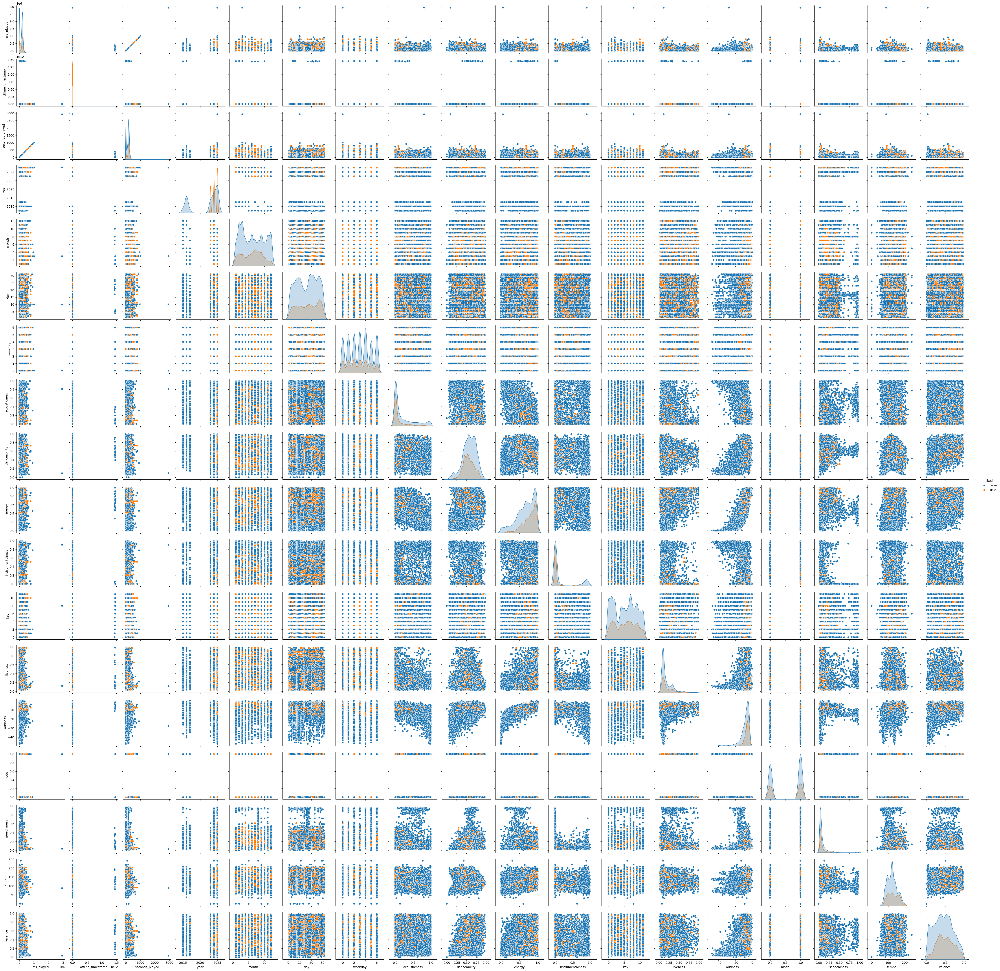

In [13]:
# Select all numeric columns for the pairplot
numeric_columns = df.select_dtypes(include=['number']).columns

# Ensure 'liked' is included
columns_to_plot = list(numeric_columns) + ['liked']

# Create the pairplot with hue
sns.pairplot(df[columns_to_plot], hue='liked')
plt.show()


## PLS based on liked

In [6]:
# load data from csv
import pandas as pd
df = pd.read_csv('data/streaming_history_with_features.csv')
#drop columns
df = df.drop(columns=['episode_name', 'episode_show_name', 'spotify_episode_uri', 'audiobook_title', 'audiobook_uri', 'audiobook_chapter_uri', 'audiobook_chapter_title'])
#drop nan rows
df = df.dropna()

/tmp/ipykernel_44782/4135871213.py:3: DtypeWarning: Columns (20) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('data/streaming_history_with_features.csv')


In [37]:
from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler

# Select numeric columns for PLS
numeric_columns = df.select_dtypes(include=['number']).columns

X = df[numeric_columns]
y = df['liked'].astype(int)  # Convert boolean to integer for regression

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Perform PLS regression
pls = PLSRegression(n_components=10)
pls.fit(X_train, y_train)

# Predict on the test set
y_pred = pls.predict(X_test)
y_pred_binary = (y_pred > 0.5).astype(int)  # Convert predictions to binary

# Evaluate the model
print(classification_report(y_test, y_pred_binary))

              precision    recall  f1-score   support

           0       0.67      0.96      0.79      4704
           1       0.58      0.12      0.19      2458

    accuracy                           0.67      7162
   macro avg       0.63      0.54      0.49      7162
weighted avg       0.64      0.67      0.59      7162



<Figure size 7680x5760 with 0 Axes>

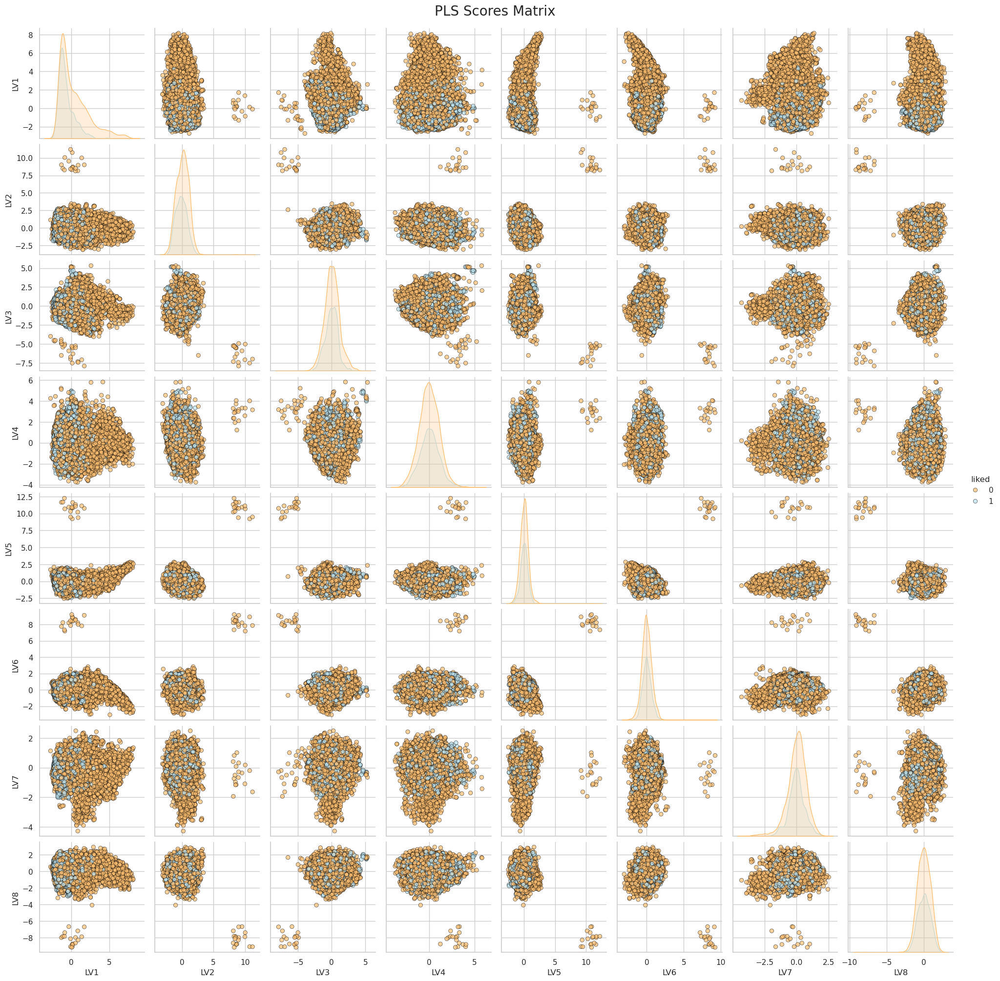

In [39]:
import seaborn as sns
plt.figure(dpi=1200)
sns.set_style('whitegrid')
sns.set_context('notebook')

# Create a DataFrame for PLS scores
pls_scores_df = pd.DataFrame(pls.x_scores_, columns=[f'LV{i+1}' for i in range(pls.x_scores_.shape[1])])
pls_scores_df['liked'] = y_train.reset_index(drop=True)

# Plot the pairplot for the first few latent variables
g = sns.pairplot(pls_scores_df, vars=['LV1', 'LV2', 'LV3', 'LV4', 'LV5', 'LV6', 'LV7', 'LV8'], hue='liked', diag_kind='kde',
                 palette='RdYlBu', plot_kws=dict(edgecolor="black", linewidth=0.5, alpha=0.7))
g.fig.suptitle('PLS Scores Matrix', y=1.01, fontsize=20)

plt.show()

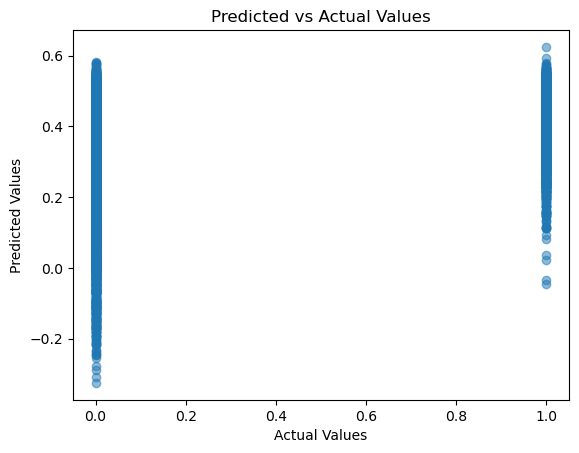

In [9]:
# Plot predicted vs actual values
import matplotlib.pyplot as plt
plt.scatter(y_test, y_pred, alpha=0.5)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Predicted vs Actual Values')
plt.show()

### PCA

In [14]:
def scree_plot(PCA, ax=plt):
    """
    In:
        PCA : sklearn.decomposition.PCA
            Fitted PCA object
    Out:
        fig : matplotlib.pyplot.figure object
            the scree plot object
    """

    expl_var_1 = PCA.explained_variance_ratio_

    with plt.style.context(('ggplot')):
        
        
    
        ax.plot(expl_var_1,'-o', label="Explained Variance %")
        ax.plot(np.cumsum(expl_var_1),'-o', label = 'Cumulative variance %')
        ax.set_xlabel("PC number")
        ax.set_ylabel('Variance %')
        ax.set_title('Scree plot')
        
        ax.legend()
        #plt.show()

    


def scores_plot(scores, y, PCs=(1,2), Title='Scores Plot'):
    """
    In:
        scores : np.array of shape (Nrows, Ncomp)
            scores matrix
        y : np.array of shape (Nrows,)
            vector of class labels; 
        PCs [optional] :  2-tuple of integers
            Principle Components to be plotted
    Out:
        fig : matplotlib.pyplot.figure object
            scores plot object
    """
    
    unique = np.unique(y) # list of unique labels
    colors = [plt.cm.jet(float(i)/len(unique)) for i in range(len(unique))]
    
    PCx = PCs[0]
    PCy = PCs[1]
    
    fig = plt.figure()

    with plt.style.context(('ggplot')):
        for i, u in enumerate(unique):
            col = np.expand_dims(np.array(colors[i]), axis=0)
            xi = [scores[j,PCx-1] for j in range(len(scores[:,PCx-1])) if y[j] == u]
            yi = [scores[j,PCy-1] for j in range(len(scores[:,PCy-1])) if y[j] == u]
            plt.scatter(xi, yi, c=col, s=60, edgecolors='k',label=str(u))
    
        plt.xlabel('PC'+str(PCx))
        plt.ylabel('PC'+str(PCy))
        plt.legend(unique,loc='lower right')
        plt.title(Title)
        #plt.show()

    return fig


def loading_plot(loadings, dim, PCs=[1], xlabel='wave length [nm]', ax=plt):
    """
    In:
        loadings : np.array of shape (Nrows, Ncomp)
            loadings matrix
        dim : numpy.ndarray of shape (n_features,)
            Wavelength, -number etc.
        PCs [optional] :  list of integers
            Principle Components to be plotted
    Out:
        fig : matplotlib.pyplot.figure object
            loadings plot object
    """
    if ax==plt:
        fig = plt.figure()
    
        
        with plt.style.context(('ggplot')):
            for PC in PCs:
                ax.plot(dim, loadings[:,PC-1], label='PC'+str(PC))

        ax.xlabel(xlabel)
        ax.ylabel('Loading [a.u.]')
        ax.legend()

        return fig
    else:
        with plt.style.context(('ggplot')):
            for PC in PCs:
                ax.plot(dim, loadings[:,PC-1], label='PC'+str(PC))

        ax.xlabel(xlabel)
        ax.ylabel('Loading [a.u.]')
        ax.legend()

def Tsq_Q_plot(X, scores, loadings, conf=0.95, ax=plt):
    """
    T^2-Q-Plot of PCA results
    adapted from https://nirpyresearch.com/outliers-detection-pls-regression-nir-spectroscopy-python/ 
    
    In:
    X : np.array of shape (Nrows, Ncomp)
        data matrix
    scores : np.array of shape (Nrows, Ncomp)
        scores matrix
    loadings : np.array of shape (Nrows, Ncomp)
        loadings matrix
    conf [optional]: float
        confidence level

    Out:
        fig : matplotlib.pyplot.figure object
            T^2-Q plot object
    """

    ncomp = scores.shape[1]

    # residuals ("errors")
    Err = X - np.dot(scores,loadings.T)

    # Calculate Q-residuals (sum over the rows of the error array)
    Q = np.sum(Err**2, axis=1)

    # Calculate Hotelling's T-squared (note that data are normalised by default)
    Tsq = np.sum((scores/np.std(scores, axis=0))**2, axis=1)
    
    from scipy.stats import f
    # Calculate confidence level for T-squared from the ppf of the F distribution
    Tsq_conf =  f.ppf(q=conf, dfn=ncomp, \
                dfd=X.shape[0])*ncomp*(X.shape[0]-1)/(X.shape[0]-ncomp)

    # Estimate the confidence level for the Q-residuals
    i = np.max(Q)+1
    while 1-np.sum(Q>i)/np.sum(Q>0) > conf:
        i -= 1
    Q_conf = i

   

    with plt.style.context(('ggplot')):
        ax.plot(Tsq, Q, 'o')
    
        ax.plot([Tsq_conf,Tsq_conf],[plt.axis()[2],plt.axis()[3]],  '--')
        ax.plot([plt.axis()[0],plt.axis()[1]],[Q_conf,Q_conf],  '--')
        ax.set_xlabel("Hotelling's T-squared")
        ax.set_ylabel('Q residuals')
        ax.set_title('TSQ Plot')
    
    #plt.show()

    return Q, Tsq

In [ ]:
# perform PCA
from sklearn.decomposition import PCA
import numpy as np
pca = PCA(n_components=10)
pca.fit(X_scaled)
X_pca = pca.transform(X_scaled)

#Loadings
loadings = pca.components_.T
loadings_df = pd.DataFrame(loadings, columns = ('PC' + str(i) for i in np.arange(1,11))) 

#scores
scores = pca.transform(X_scaled)
scores_df = pd.DataFrame(scores, columns= ('PC' + str(i) for i in np.arange(1,11)))
scores_df['liked'] = df['liked']

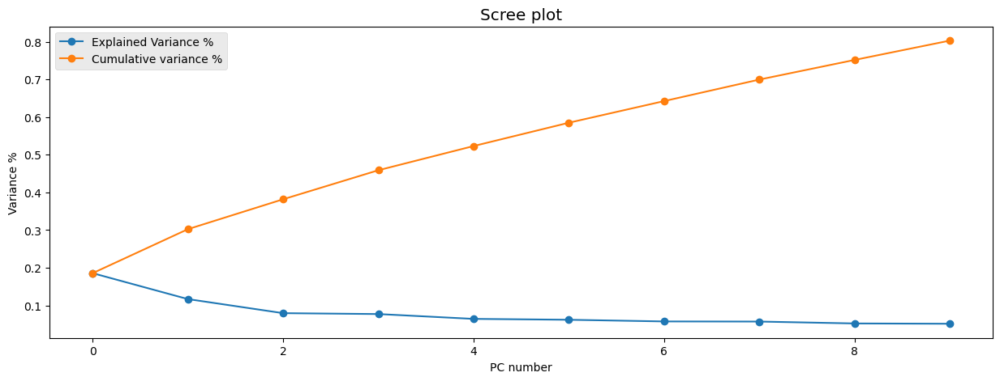

In [23]:
fig,ax1=plt.subplots(ncols=1, figsize=(15,5))
scree_plot(pca, ax=ax1)
plt.show()

In [27]:
scores_df['year'] = df['year']

<Figure size 7680x5760 with 0 Axes>

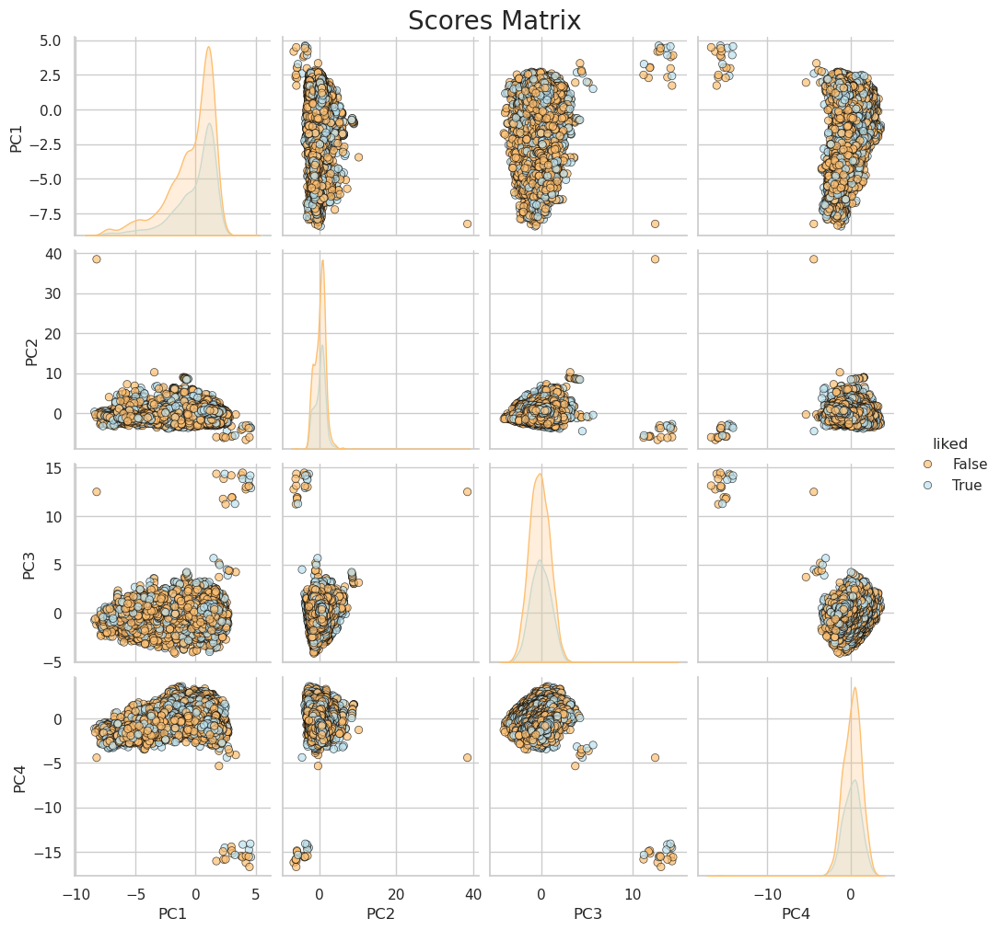

In [36]:

import seaborn as sns
plt.figure(dpi=1200)
sns.set_style('whitegrid')
sns.set_context('notebook')


g=sns.pairplot(scores_df, vars=['PC1','PC2','PC3','PC4'], hue='liked', diag_kind='kde',
                palette = 'RdYlBu', plot_kws=dict(edgecolor="black", linewidth=0.5, alpha=0.7))
g.fig.suptitle('Scores Matrix', y=1.01, fontsize=20)

plt.show()



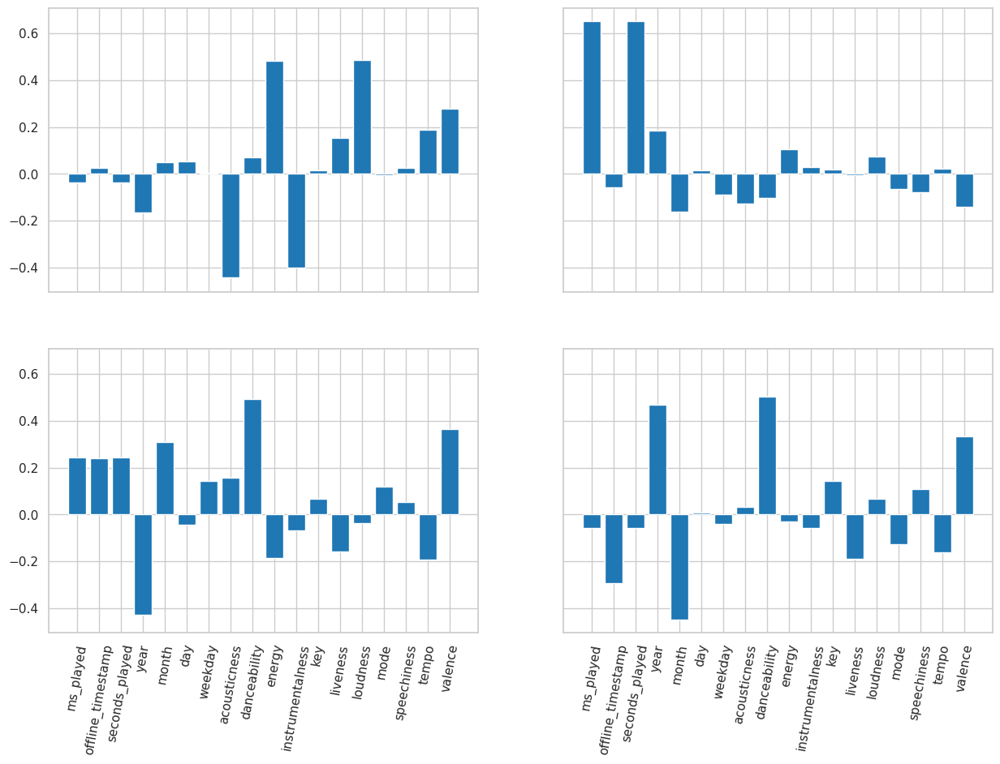

In [35]:
# loading for first 4 components with shared x and y axes
fig, axs = plt.subplots(2, 2, figsize=(15, 10), sharex=True, sharey=True)
axs[0, 0].bar(numeric_columns, loadings[:, 0], label='PC1')
axs[0, 0].tick_params(axis='x', rotation=80)
axs[0, 1].bar(numeric_columns, loadings[:, 1], label='PC2')
axs[0, 1].tick_params(axis='x', rotation=80)
axs[1, 0].bar(numeric_columns, loadings[:, 2], label='PC3')
axs[1, 0].tick_params(axis='x', rotation=80)
axs[1, 1].bar(numeric_columns, loadings[:, 3], label='PC4')
axs[1, 1].tick_params(axis='x', rotation=80)

plt.show()